<a href="https://colab.research.google.com/github/manavaditya21/Soft-Sensor-Design-for-Sulfur-Recovery-Unit/blob/manavaditya21-patch-1/Sulphur_Project_Out2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# OUTPUT 2


1.   Multiple Linear Regression
2.   Polynomial Regression
3.   Lasso Regression
4.   PCR (Principal Component Analysis)
5.   LSTM (Long Short Term Memory)
6.   KNN




# Data Preprocessing

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import comb
from scipy import stats
import statistics as st
import math

###Import Data

In [2]:
path="/content/drive/MyDrive/Machine Learning/CH-512/Project/Table - IN_Table.csv.csv"
data= pd.read_csv(path)
data.describe()

,IN1,IN2,IN3,IN4,IN5,Out1,Out2
count,1.440100e+04,1.440100e+04,1.440100e+04,1.440100e+04,1.440100e+04,1.440100e+04,1.440100e+04
mean,-3.911535e-12,-1.658765e-12,-2.405762e-12,2.957421e-12,1.521103e-12,3.521351e-11,8.724543e-13
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-2.696646e+00,-3.437986e+00,-2.639204e+00,-2.354538e+00,-1.934470e+00,-5.201644e+00,-5.989071e+00
25%,-3.385843e-01,-9.371822e-01,-3.013195e-01,-8.791605e-01,-7.130980e-01,-5.060039e-01,-5.130819e-01
50%,3.617588e-01,5.709954e-01,2.248603e-01,5.034075e-01,-4.158845e-02,1.648018e-01,-3.687546e-03
75%,6.842442e-01,7.610581e-01,4.011428e-01,8.862316e-01,5.721888e-01,6.439487e-01,5.057068e-01
max,1.590639e+00,1.939639e+00,1.844610e+00,1.654608e+00,3.615581e+00,1.396423e+01,7.637227e+00


###Removing the outliers


In [3]:
#the median method gave higher accuracy than the mean.
def outlier(data):
    for column in data.columns:
        data[column] = data[column].astype(float)
        median = st.median(data[column])
        std_dev = np.std(data[column])
        lower_bound = median - 3 * std_dev
        upper_bound = median + 3 * std_dev
        data = data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]
    return data
data_c = outlier(data)
data_c.dropna(inplace=True)
data_c.describe()

<ipython-input-3-09b541292890>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[column] = data[column].astype(float)


,IN1,IN2,IN3,IN4,IN5,Out1,Out2
count,14014.000000,14014.000000,14014.000000,14014.000000,14014.000000,14014.000000,14014.000000
mean,0.012522,0.020190,0.008128,0.025368,-0.010260,-0.001105,-0.006577
std,0.985636,0.995023,0.984860,0.991940,0.970358,0.923232,0.883825
min,-2.634673,-2.422492,-2.631096,-2.354538,-1.934470,-2.805909,-2.805356
25%,-0.286878,-0.918594,-0.292456,-0.877885,-0.709796,-0.506004,-0.513082
50%,0.366122,0.621044,0.225352,0.515633,-0.042572,0.164802,-0.003688
75%,0.680357,0.763112,0.400686,0.887366,0.566638,0.643949,0.505707
max,1.530461,1.939639,1.844610,1.654608,2.957842,3.135513,2.797981


In [4]:
data_c.dropna(inplace=True)
data_c.describe()

,IN1,IN2,IN3,IN4,IN5,Out1,Out2
count,14014.000000,14014.000000,14014.000000,14014.000000,14014.000000,14014.000000,14014.000000
mean,0.012522,0.020190,0.008128,0.025368,-0.010260,-0.001105,-0.006577
std,0.985636,0.995023,0.984860,0.991940,0.970358,0.923232,0.883825
min,-2.634673,-2.422492,-2.631096,-2.354538,-1.934470,-2.805909,-2.805356
25%,-0.286878,-0.918594,-0.292456,-0.877885,-0.709796,-0.506004,-0.513082
50%,0.366122,0.621044,0.225352,0.515633,-0.042572,0.164802,-0.003688
75%,0.680357,0.763112,0.400686,0.887366,0.566638,0.643949,0.505707
max,1.530461,1.939639,1.844610,1.654608,2.957842,3.135513,2.797981


In [5]:
data.corr()

,IN1,IN2,IN3,IN4,IN5,Out1,Out2
IN1,1.000000,0.500407,0.924350,0.438273,0.455514,0.624829,0.381853
IN2,0.500407,1.000000,0.321950,0.895081,0.081605,0.388346,0.201564
IN3,0.924350,0.321950,1.000000,0.197927,0.365890,0.572199,0.415136
IN4,0.438273,0.895081,0.197927,1.000000,0.013679,0.301107,0.203665
IN5,0.455514,0.081605,0.365890,0.013679,1.000000,0.428711,0.101761
Out1,0.624829,0.388346,0.572199,0.301107,0.428711,1.000000,-0.151741
Out2,0.381853,0.201564,0.415136,0.203665,0.101761,-0.151741,1.000000


###Plotting The Graphs

In [6]:
data_c.corr()

,IN1,IN2,IN3,IN4,IN5,Out1,Out2
IN1,1.000000,0.508753,0.922762,0.450860,0.451824,0.676426,0.439461
IN2,0.508753,1.000000,0.329712,0.899190,0.076832,0.411586,0.251953
IN3,0.922762,0.329712,1.000000,0.207395,0.362761,0.630088,0.458906
IN4,0.450860,0.899190,0.207395,1.000000,0.027312,0.335210,0.240758
IN5,0.451824,0.076832,0.362761,0.027312,1.000000,0.447183,0.144558
Out1,0.676426,0.411586,0.630088,0.335210,0.447183,1.000000,-0.006573
Out2,0.439461,0.251953,0.458906,0.240758,0.144558,-0.006573,1.000000


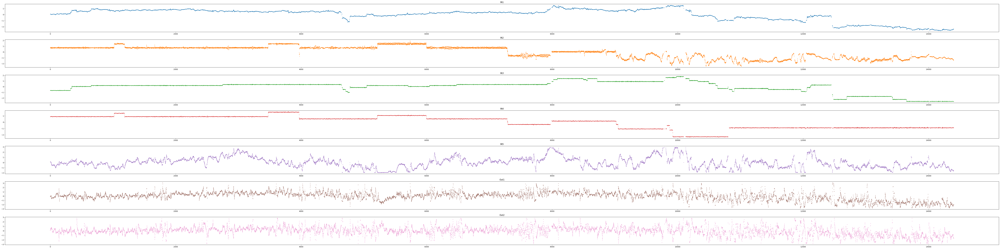

In [7]:
plt.figure(figsize=(80, 20))

for i, col in enumerate(data.columns, start=1):
    plt.subplot(7, 1, i)
    plt.scatter(data_c.index, data_c[col], marker='*', color='C{}'.format(i-1),s=2)
    plt.title(col)

plt.tight_layout()
plt.show()

### Error Details

In [8]:
def results(y2_test,y2_pred,k):
  from sklearn.metrics import mean_squared_error,r2_score

  SSE= mean_squared_error(y2_test,y2_pred)
  MSE= np.mean((y2_test - y2_pred) **2)
  R2 = r2_score(y2_test,y2_pred)
  n=len(y2_test)

  AIC = 2*k          +n*(math.log(math.pi*2)+math.log(SSE/n)+1)
  BIC = k*math.log(n)+n*(math.log(math.pi*2)+math.log(SSE/n)+1)

#Errors
  print('R2  : ', round(R2,4))
  print('MSE : ', round(MSE,4))
  print('aic : ', round(AIC* 10**3)/10**3)
  print('bic : ', round(BIC* 10**3)/10**3)



#To Plot
  plt.figure(figsize=(200,4))
  plt.plot(range(len(Y2_test)), Y2_test, color='blue', label='Actual Y2')
  plt.plot(range(len(Y2_test)), Y2_pred, color='red', label='Predicted Y2')
  plt.xlabel('Sample Index')
  plt.ylabel('Y2 Value')
  plt.title('Y2 Actual vs Predicted')
  plt.legend()
  plt.show()

#Multivariate Linear Regression

###Loading Data

In [335]:
x  = data_c.loc[:,['IN3','IN1','IN2']]
y1 = data_c.loc[:,'Out2']

In [336]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = scaler.fit_transform(x)

In [337]:
from sklearn.model_selection import train_test_split
x_train, x_test, Y2_train, Y2_test = train_test_split(x, y1,test_size=0.2, random_state=42)

### Applying Regression

In [338]:
from sklearn.linear_model import LinearRegression
regressor_y1 = LinearRegression()
regressor_y1.fit(x_train, Y2_train)

LinearRegression()

In [339]:
Y2_test_values = Y2_test.values
Y2_pred = regressor_y1.predict(x_test)
print(np.concatenate((Y2_pred.reshape(len(Y2_pred),1), Y2_test_values.reshape(len(Y2_test_values),1)),1))

[[ 0.14 -0.39]
 [ 0.21  0.12]
 [-0.36 -1.53]
 ...
 [ 0.11 -0.13]
 [ 0.18 -2.3 ]
 [ 0.25  0.12]]


### Plotting Result

R2  :  0.2293
MSE :  0.5794
aic :  -15820.855
bic :  -15803.04


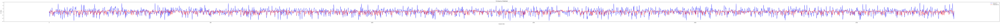

In [340]:
results(Y2_test,Y2_pred, x.shape[1])

# Polynomial Regression





###Loading Data

In [341]:
x  = data_c.loc[:,['IN1','IN2','IN3','IN4','IN5']]
y1 = data_c.loc[:,'Out2']

In [342]:
from sklearn.model_selection import train_test_split
x_train, x_test, Y2_train, Y2_test = train_test_split(x, y1,test_size=0.2, random_state=42)

###Applying Regression

In [343]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

Degree=5
variable= len(x.columns)
Parameters = comb(variable+Degree, Degree)

poly_reg = PolynomialFeatures(degree = Degree)
x_poly = poly_reg.fit_transform(x_train)

regressor = LinearRegression()
regressor.fit(x_poly, Y2_train)

LinearRegression()

In [344]:
Y2_test_values = Y2_test.values
Y2_pred = regressor.predict(poly_reg.transform(x_test))
np.set_printoptions(precision=2)
print(np.concatenate((Y2_pred.reshape(len(Y2_pred),1), Y2_test_values.reshape(len(Y2_test),1)),1))

[[ 0.14 -0.39]
 [ 0.07  0.12]
 [-0.36 -1.53]
 ...
 [ 0.36 -0.13]
 [-0.58 -2.3 ]
 [ 0.04  0.12]]


### Plotting Results

R2  :  0.4041
MSE :  0.4479
aic :  -16043.929
bic :  -14547.44


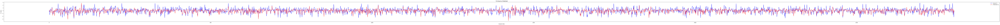

In [345]:
results(Y2_test,Y2_pred,Parameters)

# Lasso regression

###Loading Data

In [346]:
X  = data_c.loc[:,['IN1','IN2','IN5']]
y1 = data_c.loc[:,'Out2']

In [347]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y2_train, Y2_test = train_test_split(X,y1, test_size = 0.3, random_state = 0)

###Applying Lasso

In [348]:
from sklearn.linear_model import LassoCV
alphas = np.logspace(-4, 4, 100)

lasso_cv = LassoCV(alphas=alphas, cv=5)  # cv is the number of folds for cross-validation

lasso_cv.fit(X_train, Y2_train)
optimal_alpha = lasso_cv.alpha_
print("Optimal alpha:",optimal_alpha)

Optimal alpha: 0.0001


In [349]:
from sklearn.linear_model import Lasso
lasso_model = Lasso(alpha= optimal_alpha)
lasso_model.fit(X_train, Y2_train)

Y2_test_values = Y2_test.values
Y2_pred = lasso_model.predict(X_test)
print(np.concatenate((Y2_pred.reshape(len(Y2_pred),1), Y2_test_values.reshape(len(Y2_test),1)),1))

[[ 0.13  0.63]
 [-0.75 -0.39]
 [ 0.28  0.51]
 ...
 [ 0.16 -0.26]
 [ 0.38  0.25]
 [ 0.27 -0.13]]


###Plotting Results

R2  :  0.1936
MSE :  0.6289
aic :  -25097.593
bic :  -25078.561


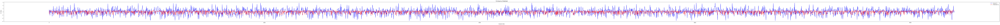

In [350]:
results(Y2_test,Y2_pred,3)

#PCR

In [351]:
from sklearn.decomposition import PCA

X  = data_c.loc[:,['IN1','IN2','IN3','IN4','IN5']]
y = data_c.loc[:,'Out2']

X_train, X_test, Y2_train, Y2_test = train_test_split(X, y, test_size=0.3, random_state=42)

pca = PCA(n_components=3)
x_train = pca.fit_transform(X_train)
x_test = pca.transform(X_test)

explained_variance = pca.explained_variance_ratio_

print("Explained Variance Ratio:")
sum=0

for i, ratio in enumerate(explained_variance):
    print(f"  Component {i+1}: {ratio:.4f}")
    sum+= ratio
print("Data Contained = ",sum*100,"%")

Explained Variance Ratio:
  Component 1: 0.5635
  Component 2: 0.2790
  Component 3: 0.1302
Data Contained =  97.27078409571043 %


###Applying Regression

In [352]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

Degree=5
variable= len(x.columns)
Parameters = comb(variable+Degree, Degree)

poly_reg = PolynomialFeatures(degree = Degree)
x_poly = poly_reg.fit_transform(x_train)

regressor = LinearRegression()
regressor.fit(x_poly, Y2_train)

LinearRegression()

In [353]:
Y2_test_values = Y2_test.values
Y2_pred = regressor.predict(poly_reg.transform(x_test))
np.set_printoptions(precision=2)
print(np.concatenate((Y2_pred.reshape(len(Y2_pred),1), Y2_test_values.reshape(len(Y2_test),1)),1))

[[-0.04 -0.39]
 [ 0.11  0.12]
 [ 0.01 -1.53]
 ...
 [-0.92 -1.53]
 [ 0.29  0.63]
 [-1.1  -1.02]]


### Plotting Results

R2  :  0.2537
MSE :  0.5737
aic :  -24985.826
bic :  -23387.131


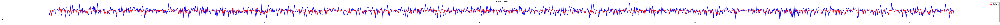

In [354]:
results(Y2_test,Y2_pred,Parameters)

R2  :  0.2537
MSE :  0.5737
aic :  -25481.826
bic :  -25456.45


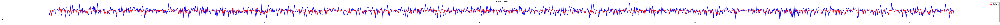

In [355]:
results(Y2_test,Y2_pred,4)

#LSTM Trials


In [12]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score
from tensorflow.keras.callbacks import Callback

### Callback Function

In [13]:
class R2Callback(Callback):
    def __init__(self, X_val, Y_val):
        super(R2Callback, self).__init__()
        self.X_val = X_val
        self.Y_val = Y_val
        self.r2_scores = []

    def on_epoch_end(self, epoch, logs={}):
        if (epoch + 1) % 25 == 0:  # Calculate R2 score every 25 epochs
            Y_pred = self.model.predict(self.X_val)
            r2 = r2_score(self.Y_val, Y_pred)
            self.r2_scores.append(r2)
            print(f'R2 score at epoch {epoch + 1}: {r2}')


###Data Loading & Scaling


In [14]:
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data_c[['IN1', 'IN2','IN3','IN4', 'Out2']])

X = scaled_data[:, :-1]
Y = scaled_data[:, -1]

X_train, X_test, Y2_train, Y2_test = train_test_split(X, Y, test_size=0.2, random_state=42)

X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

### Applying Regression

In [15]:
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(1, 4)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mae')

r2_callback = R2Callback(X_test, Y2_test)

model.fit(X_train, Y2_train, epochs=280, batch_size=64, verbose=5, callbacks=[r2_callback])

loss = model.evaluate(X_test, Y2_test, verbose=2)
print(f'Test loss: {loss}')

Y2_pred = model.predict(X_test)

Epoch 1/280
Epoch 2/280
Epoch 3/280
Epoch 4/280
Epoch 5/280
Epoch 6/280
Epoch 7/280
Epoch 8/280
Epoch 9/280
Epoch 10/280
Epoch 11/280
Epoch 12/280
Epoch 13/280
Epoch 14/280
Epoch 15/280
Epoch 16/280
Epoch 17/280
Epoch 18/280
Epoch 19/280
Epoch 20/280
Epoch 21/280
Epoch 22/280
Epoch 23/280
Epoch 24/280
Epoch 25/280
88/88 [==============================] - 0s 2ms/step
R2 score at epoch 25: 0.24587511282553387
Epoch 26/280
Epoch 27/280
Epoch 28/280
Epoch 29/280
Epoch 30/280
Epoch 31/280
Epoch 32/280
Epoch 33/280
Epoch 34/280
Epoch 35/280
Epoch 36/280
Epoch 37/280
Epoch 38/280
Epoch 39/280
Epoch 40/280
Epoch 41/280
Epoch 42/280
Epoch 43/280
Epoch 44/280
Epoch 45/280
Epoch 46/280
Epoch 47/280
Epoch 48/280
Epoch 49/280
Epoch 50/280
88/88 [==============================] - 0s 2ms/step
R2 score at epoch 50: 0.24618681440383594
Epoch 51/280
Epoch 52/280
Epoch 53/280
Epoch 54/280
Epoch 55/280
Epoch 56/280
Epoch 57/280
Epoch 58/280
Epoch 59/280
Epoch 60/280
Epoch 61/280
Epoch 62/280
Epoch 63/280


### Plotting results

R2  :  0.284
MSE :  0.0311
aic :  -25686.462
bic :  -25662.708


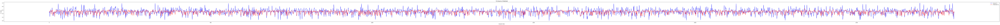

In [16]:
results(Y2_test,Y2_pred,4)

# KNN

In [9]:
import pandas as pd
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, PolynomialFeatures


X = data_c.loc[:,['IN1','IN2','IN3','IN4','IN5']]
y = data_c.loc[:,'Out2']

# Split the data into training and testing sets
X_train, X_test, Y2_train, Y2_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


knn = KNeighborsRegressor(n_neighbors=5)

#### LInear

R2  :  0.4678
MSE :  0.4001
aic :  -16854.901
bic :  -16825.209


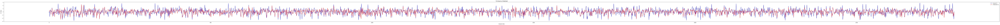

In [11]:
knn.fit(X_train, Y2_train)
Y2_pred = knn.predict(X_test)
results(Y2_test,Y2_pred,X.shape[1])

#### PCA Based Linear After KNN




In [12]:
pca = PCA(n_components=3)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(X_train_pca, Y2_train)
Y2_pred = knn.predict(X_test_pca)

results(Y2_test,Y2_pred,3)

NameError: name 'PCA' is not defined

### Polynomial after KNN

R2  :  0.4526
MSE :  0.4115
aic :  -16780.075
bic :  -16762.26


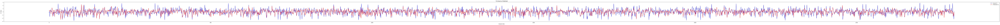

In [13]:
from sklearn.pipeline import Pipeline

X = data_c.loc[:, ['IN1', 'IN2', 'IN5', 'IN3', 'IN4']]
y = data_c.loc[:, 'Out2']

# Split the data into training and testing sets
X_train, X_test, Y2_train, Y2_test = train_test_split(X, y, test_size=0.2, random_state=42)

polynomial_degree = 3

polynomial_regression = Pipeline([
    ('poly', PolynomialFeatures(degree=polynomial_degree)),
    ('scaler', StandardScaler()),
    ('knn', KNeighborsRegressor(n_neighbors=5))
])

# Train the pipeline
polynomial_regression.fit(X_train, Y2_train)

Y2_pred = polynomial_regression.predict(X_test)


results(Y2_test,Y2_pred,3)